In [1]:
import sys
import numpy as np
import spectral as sp
import matplotlib as mpl
import matplotlib.pyplot as plt

sys.path.append('../')
from preprocessing import *
from extinctions import *
from plotting_parameters import *
# set_plotting_style('latex')

In [2]:
bands_range = [520,900]
band_centers = np.arange(bands_range[0], bands_range[1]+1)

extinction_dict = get_extinctions(bands_range)
cyt_c_ox = extinction_dict["cyt_c_ox"]
cyt_c_red = extinction_dict["cyt_c_red"]
cyt_b_ox = extinction_dict["cyt_b_ox"]
cyt_b_red = extinction_dict["cyt_b_red"]
cyt_oxi_ox = extinction_dict["cyt_oxi_ox"]
cyt_oxi_red = extinction_dict["cyt_oxi_red"]
hb = extinction_dict["hb"]
hbo2 = extinction_dict["hbo2"]
water = extinction_dict["water"]
fat = extinction_dict["fat"]
scatter_simple = (band_centers/500)**(-1.2)

endmember_labels_scatter = ["oxCytc", "redCytc", "oxCytb", "redCytb", "oxCCO", "redCCO", "HHb", "HbO$_2$", "water", "lipids", "a'"]
M_scatter_simple = np.vstack((cyt_c_ox, cyt_c_red, cyt_b_ox, cyt_b_red, cyt_oxi_ox, cyt_oxi_red, hb, hbo2, water, fat, scatter_simple)).T
M_scatter_simple_smooth = smooth_spectral(M_scatter_simple.T,5).T

/home/martin_ivan/anaconda3/envs/thesis/lib/python3.10/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)


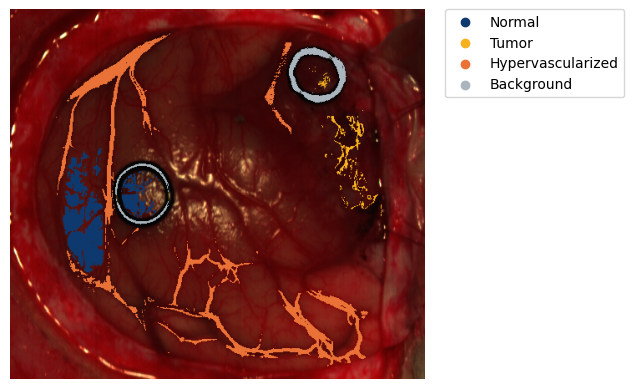

In [3]:
data_folder = "../../datasets/helicoid/012-01"
# data_folder = "../../datasets/helicoid/008-01"

class_labels = ["Not labled", "Normal", "Tumor", "Hypervascularized", "Background"]
class_colors = ["white", tum_blue_dark_2, tum_orange, tum_red, tum_grey_5]

# Load the sp data
img = sp.open_image(data_folder + "/raw.hdr")
white_ref = sp.open_image(data_folder + "/whiteReference.hdr")
dark_ref = sp.open_image(data_folder + "/darkReference.hdr")
gt_map = sp.open_image(data_folder + "/gtMap.hdr")
plot_img(img, gt_map, class_labels, class_colors, figsize=(5,5), legend=True)

# preprocessing
img_interp, band_centers = bands_lin_interpolation(img, img.bands.centers, bands_range)
white_ref_interp, _ = bands_lin_interpolation(white_ref, img.bands.centers, bands_range)
dark_ref_interp, _ = bands_lin_interpolation(dark_ref, img.bands.centers, bands_range)
img_calib = calibrate_img(img_interp, white_ref_interp, dark_ref_interp)
img_calib_norm = img_calib / np.linalg.norm(img_calib, axis=(0,1), ord=1, keepdims=True)
img_smooth = smooth_spectral(img_calib_norm, 5)
absorbance = -np.log(img_smooth - np.min(img_smooth.flatten()) + 1e-8)

### CEM

In [8]:
from pysptools.detection.detect import CEM

def cem_2d(spectr, endmember):
    shape = spectr.shape
    spectr = spectr.reshape(-1, shape[-1])
    y = CEM(spectr, endmember)
    return y.reshape(shape[:-1])

Endmember 1 done
Endmember 2 done
Endmember 3 done
Endmember 4 done
Endmember 5 done
Endmember 6 done
Endmember 7 done
Endmember 8 done
Endmember 9 done
Endmember 10 done
Endmember 11 done


(<Figure size 500x500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

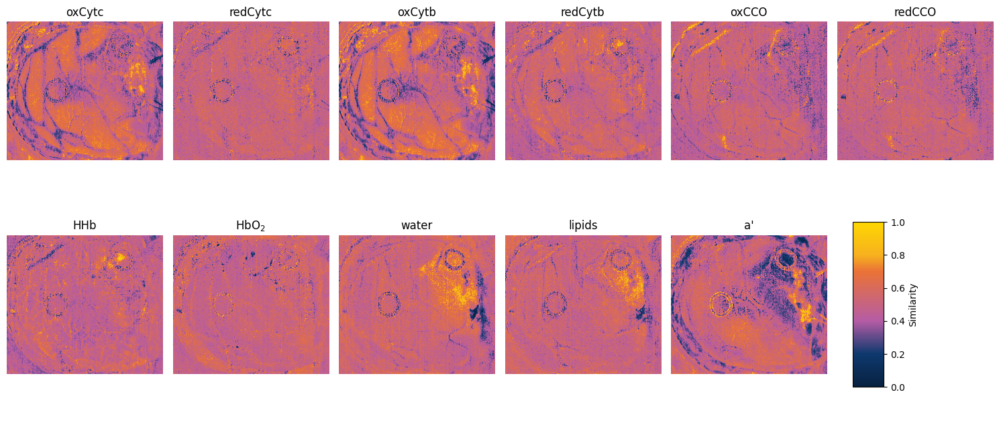

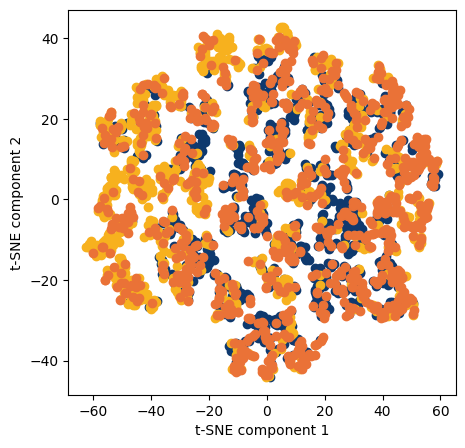

In [37]:
from scipy.ndimage import gaussian_filter
absorbance_smooth = gaussian_filter(absorbance, sigma=3, axes=(2))

n = M_scatter_simple_smooth.shape[1]
data = np.zeros((absorbance.shape[0],absorbance.shape[1],n))
for i in range(n):
    data[:,:,i] = cem_2d(absorbance_smooth, M_scatter_simple_smooth[:,i])
    print(f"Endmember {i+1} done")
# plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(2.8,2.5), legend_loc=None)
# plot_pca(data, gt_map, class_labels, mode='equal', figsize=(2.55,2.5), legend_loc=None)
# plot_concentrations(data, endmember_labels_scatter);

plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

### ICEM

In [4]:
from pysptools.detection.detect import ICEM

def icem_2d(spectr, endmember, lmda=1e-8):
    shape = spectr.shape
    spectr = spectr.reshape(-1, shape[-1])
    y = ICEM(spectr, endmember, lmda)
    return y.reshape(shape[:-1])

(<Figure size 500x500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

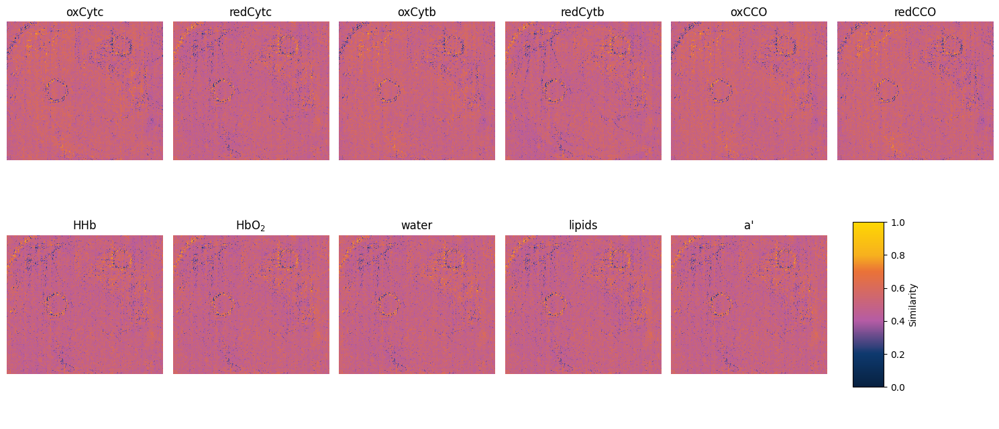

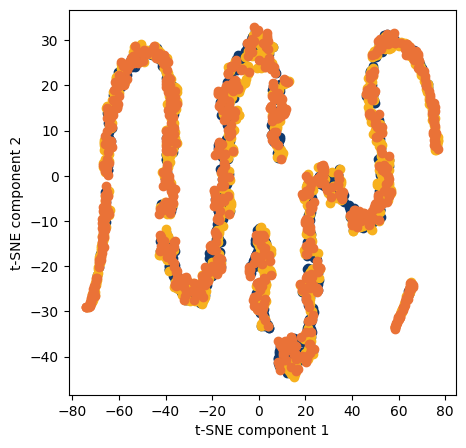

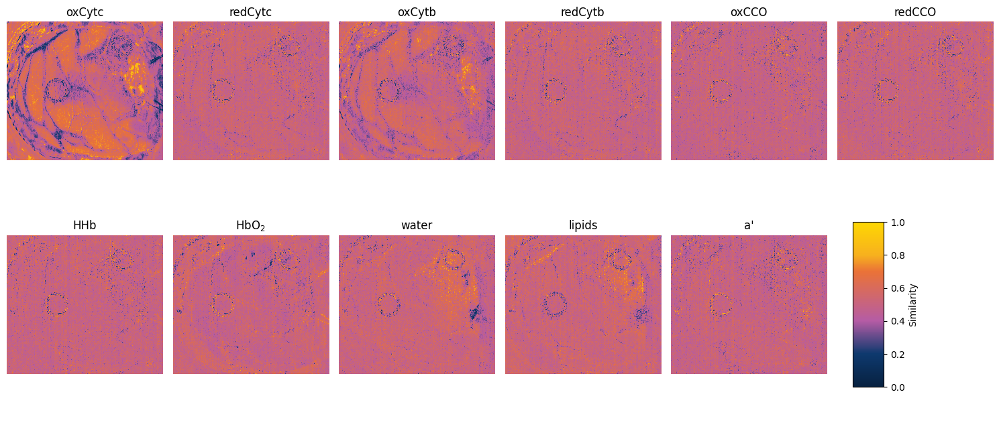

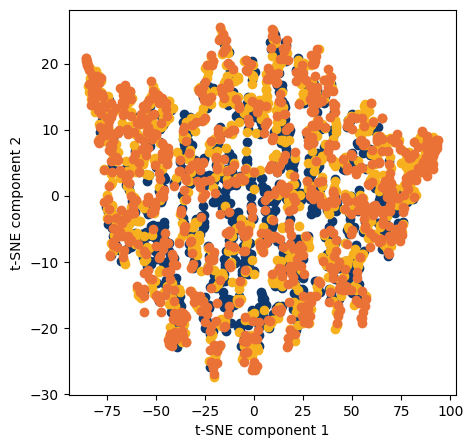

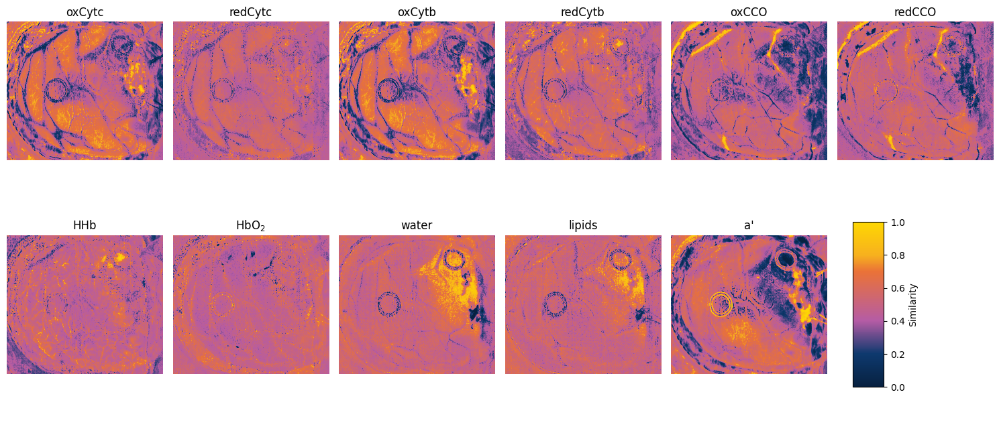

...

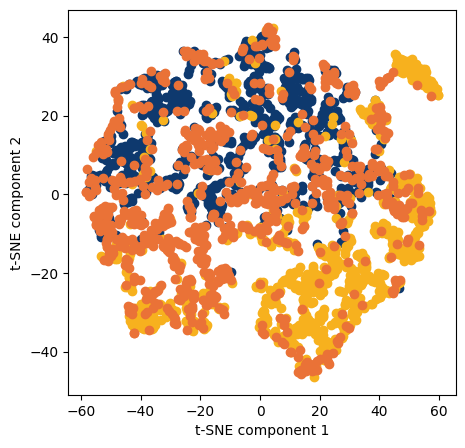

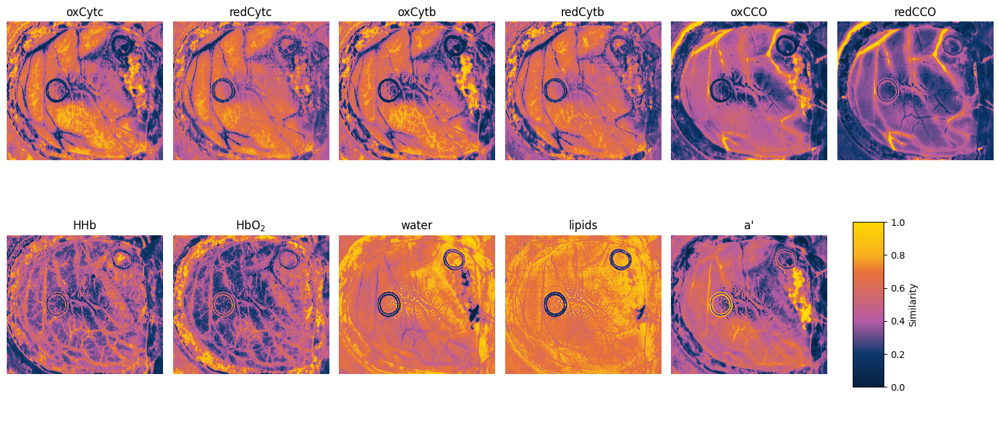

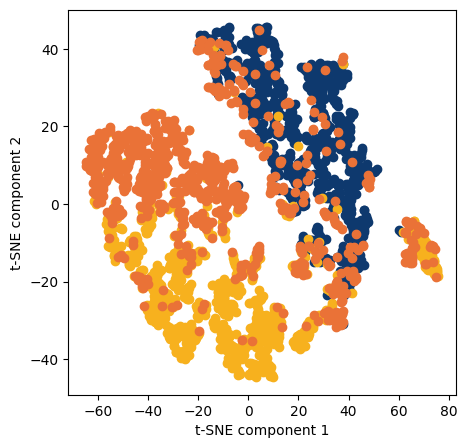

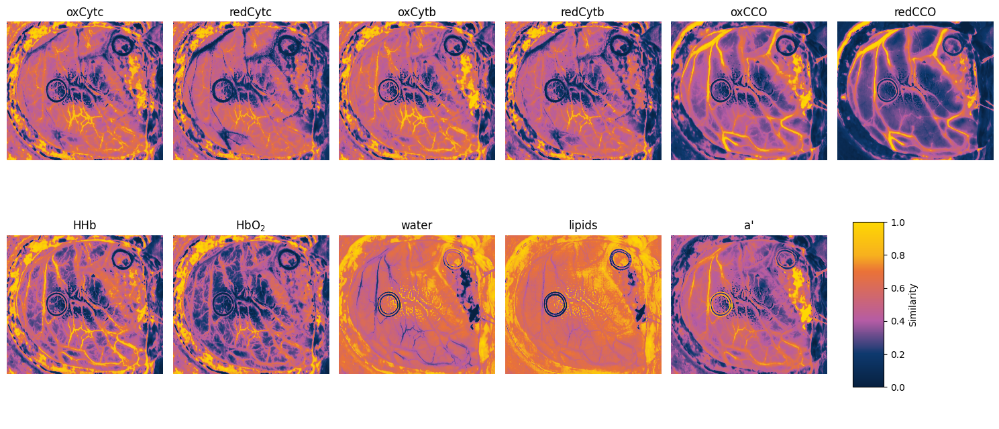

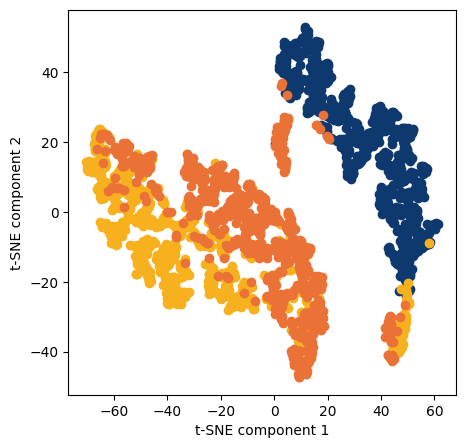

In [5]:
n = M_scatter_simple_smooth.shape[1]
data = np.zeros((absorbance.shape[0],absorbance.shape[1],n))

for i in range(n):
    data[:,:,i] = icem_2d(absorbance, M_scatter_simple_smooth[:,i], lmda=1e-5)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

for i in range(n):
    data[:,:,i] = icem_2d(absorbance, M_scatter_simple_smooth[:,i], lmda=1e-4)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

for i in range(n):
    data[:,:,i] = icem_2d(absorbance, M_scatter_simple_smooth[:,i], lmda=1e-3)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

for i in range(n):
    data[:,:,i] = icem_2d(absorbance, M_scatter_simple_smooth[:,i], lmda=1e-2)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

for i in range(n):
    data[:,:,i] = icem_2d(absorbance, M_scatter_simple_smooth[:,i], lmda=1e-1)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

for i in range(n):
    data[:,:,i] = icem_2d(absorbance, M_scatter_simple_smooth[:,i], lmda=1)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)

In [4]:
def svd_cem(spectr, endmember, r=5):
    '''
    Improved constrained energy minimization (ICEM) algorithm.
    input:
        spectr: image to unmix, shape (...,k) where k is the number of bands and ... are the spatial or time dimensions
        endmember: endmember to unmix, shape (k,)
        lmda: regularization parameter, float
    output:
        heatmap, np.array
    '''
    input_shape = spectr.shape
    M = spectr.reshape(-1, input_shape[-1])
    t = endmember

    def corr(M):
        p, N = M.shape
        return np.dot(M, M.T) / N

    N, p = M.shape
    R_hat = corr(M.T) #lmda * np.eye(p)

    # approximate R_hat inverse
    U, s, Vh = np.linalg.svd(R_hat, full_matrices=False)
    S_inv = np.diag(1/s)
    Rinv= Vh.T[:,:r] @ S_inv[:r,:r] @ U.T[:r,:]

    denom = np.dot(t.T, np.dot(Rinv, t))
    t_Rinv = np.dot(t.T, Rinv)
    y = np.dot(t_Rinv , M[0:,:].T) / denom

    return y.reshape(input_shape[:-1])

(<Figure size 500x500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

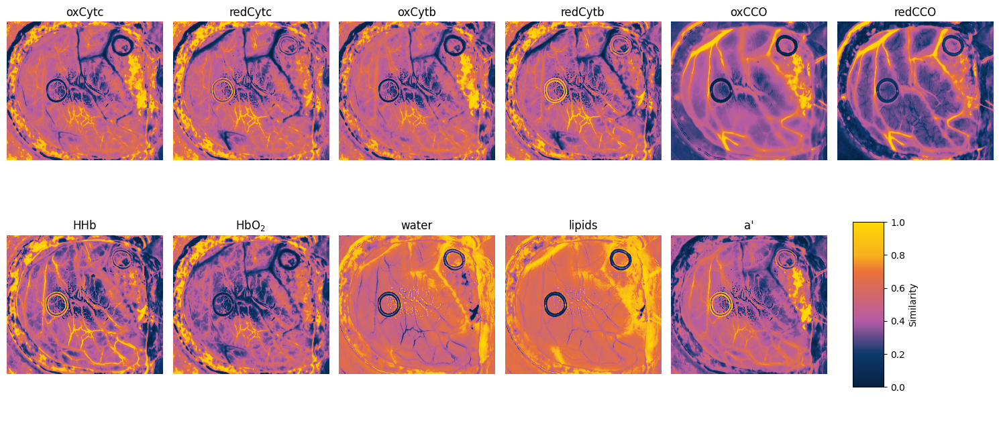

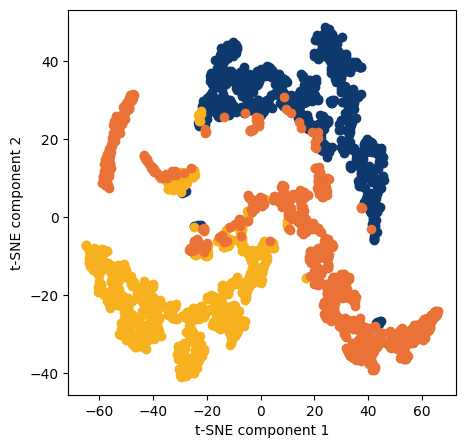

In [9]:
n = M_scatter_simple_smooth.shape[1]
data = np.zeros((absorbance.shape[0],absorbance.shape[1],n))
for i in range(n):
    data[:,:,i] = svd_cem(absorbance, M_scatter_simple_smooth[:,i], r=5)
plot_concentrations(clip_data(data, 1,99), endmember_labels_scatter, figsize=(15,7));
plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(5,5), legend_loc=None)